In [2]:
# imports
from itertools import combinations
from scipy import stats
import vae_utils as vae_utils
import random
# Models
from sklearn.base import BaseEstimator, TransformerMixin

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier as lgbm
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression, BayesianRidge, Ridge
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans

# pipelines
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline

# preprocessors
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler
from sklearn.feature_selection import chi2, f_classif, mutual_info_classif, SelectKBest, SelectFromModel, RFE, RFECV, SequentialFeatureSelector
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, KNNImputer, IterativeImputer

# Samplers
from imblearn.combine import SMOTEENN, SMOTETomek
from imblearn.over_sampling import SMOTE

# metrics and splitters
from sklearn.metrics import f1_score, mean_squared_error, silhouette_score, silhouette_samples
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_auc_score

from sklearn.model_selection import StratifiedKFold, GridSearchCV
from sklearn.model_selection import train_test_split, cross_val_score

from sklearn_extra.cluster import KMedoids
import upsetplot as uplt

# utils
from sklearn.utils.validation import check_is_fitted
from sklearn.utils.class_weight import compute_class_weight
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pickle
import sys
import matplotlib_venn as venn
import matplotlib.cm as cm

# progress bar
from ipywidgets import IntProgress
from IPython.display import display

from scipy.stats import pearsonr

sys.path.append("../")

import utils_ML as uml
import upsetplot as uplt
from scipy.stats import pearsonr

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils
import torch.distributions
import torchvision

device = 'cuda' if torch.cuda.is_available() else "cpu"

In [3]:
from sklearn.utils.fixes import loguniform
loguniform(.001, 1e2)

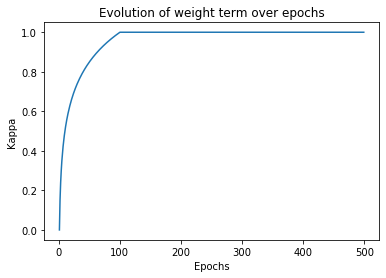

In [2]:

plt.title("Evolution of weight term over epochs")
plt.xlabel("Epochs")
plt.ylabel("Kappa")
sns.lineplot(y= loguniform(),x=range(1,500))

In [ ]:
# Load datasets
data_combat = pd.read_csv("combat_NSAF_50.csv", index_col = "assay_id")
data_quantile = pd.read_csv("quantile_norm_NSAF_50.csv", index_col = "assay_id")
data_median_norm = pd.read_csv("median_scaling_50.csv", index_col = "Unnamed: 0")
data_nsaf = pd.read_csv("NSAF_50.csv", index_col = "assay_id")
data_nsaf = np.log2(data_nsaf)

meta = pd.read_csv("../../Metadata/unified_metadata.csv")
meta = meta[meta.assay_id.isin(data_combat.index)]

groups = pd.read_csv("../../Metadata/group_cells_annotation.csv", sep =";", index_col="Unnamed: 0")
meta["Group"] = meta.cell_line.apply(lambda x: groups[groups.cell_line == x]["group"].values[0])
meta = meta.set_index("assay_id")

data_combat.sort_index(inplace=True)
data_quantile.sort_index(inplace=True)
data_median_norm.sort_index(inplace=True)
data_nsaf.sort_index(inplace=True)
meta.sort_index(inplace=True)

missing_value_mask = data_nsaf.isna()
data_combat = data_combat.where(~missing_value_mask, other=np.nan)

data_combat = data_combat.reset_index(drop=True).rename(columns={data_combat.columns[x]:x for x in range(len(data_combat.columns))})
data_quantile = data_quantile.reset_index(drop=True).rename(columns={data_quantile.columns[x]:x for x in range(len(data_quantile.columns))})
data_median_norm = data_median_norm.reset_index(drop=True).rename(columns={data_median_norm.columns[x]:x for x in range(len(data_median_norm.columns))})
data_nsaf = data_nsaf.reset_index(drop=True).rename(columns={data_nsaf.columns[x]:x for x in range(len(data_nsaf.columns))})

mapper = zip(meta.PXD_accession.unique(), sns.color_palette("pastel", n_colors=meta.PXD_accession.nunique()))
mapper = dict(mapper)

target_encoder = LabelEncoder()
targets = target_encoder.fit_transform(meta.Group)
unique_labels = pd.Series(targets).unique()
class_weights = compute_class_weight(class_weight='balanced', classes=unique_labels, y=targets)

weights = {unique_labels[i]: class_weights[i] for i in range(len(unique_labels))}
print(weights)

labels = np.array(meta.Group)

In [ ]:
labels = np.array(meta.Group)
#mmi_quant = uml.MNAR_MCAR_Imputer(max_iter=15)
mmi_quant = uml.LowestValueImputerGaussian()
mmi_quant.fit(data_quantile, labels)
imputed_df_quant = mmi_quant.transform(data_quantile, labels)
mm_scaler = MinMaxScaler()
minmax_df_quant = mm_scaler.fit_transform(imputed_df_quant)

In [3]:
protein_columns = pd.read_csv("quantile_norm_NSAF_50.csv", index_col = "assay_id").columns

# VAE hyperparameter tuning for both filtered and unfiltered dataset

- batch size (5,10,15,20)
- learning rates (.0005 .001 .0025 .005 .01)
- (warmups)
- (activation functions: ReLu vs LeakyReLu)
- size of latent space (5 10 15 20 30 50)
- size of hidden dimensions (750 500 250)

## Unfiltered

In [3]:
hyperparam_search = pd.read_csv("/home/compomics/Sam/git/python/master_thesis/Atlas_analysis/ML/results/VAE_hyperparameter_opt_LWVGI.csv", index_col="Unnamed: 0")

In [30]:
hyperparam_search.columns

Index(['epoch', 'learning_rate', 'batch_size', 'latent_space', 'kappa',
       'train_loss', 'test_loss', 'train_loss_kl', 'train_loss_mse',
       'test_loss_kl', 'test_loss_mse'],
      dtype='object')

In [32]:
latent_dims = [5, 10, 15, 20, 30, 50]
batch_sizes = [5, 10, 15, 20]

params = {"latent dimensions": [], "test_loss_mse": [], "batch size": []}

for i1 in range(len(batch_sizes)):
    for ld in latent_dims:

        subset = hyperparam_search[(hyperparam_search.batch_size == batch_sizes[i1]) & (hyperparam_search.latent_space == ld)]
        
        params["test_loss_mse"].append(subset.test_loss_mse.min())
        params["latent dimensions"].append(ld)
        params["batch size"].append(batch_sizes[i1])

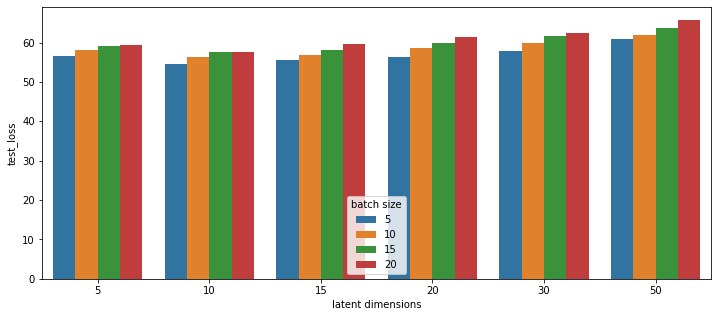

In [12]:
plt.figure(figsize=(12,5))
sns.barplot(data=pd.DataFrame(params), x="latent dimensions", y="test_loss", hue="batch size")

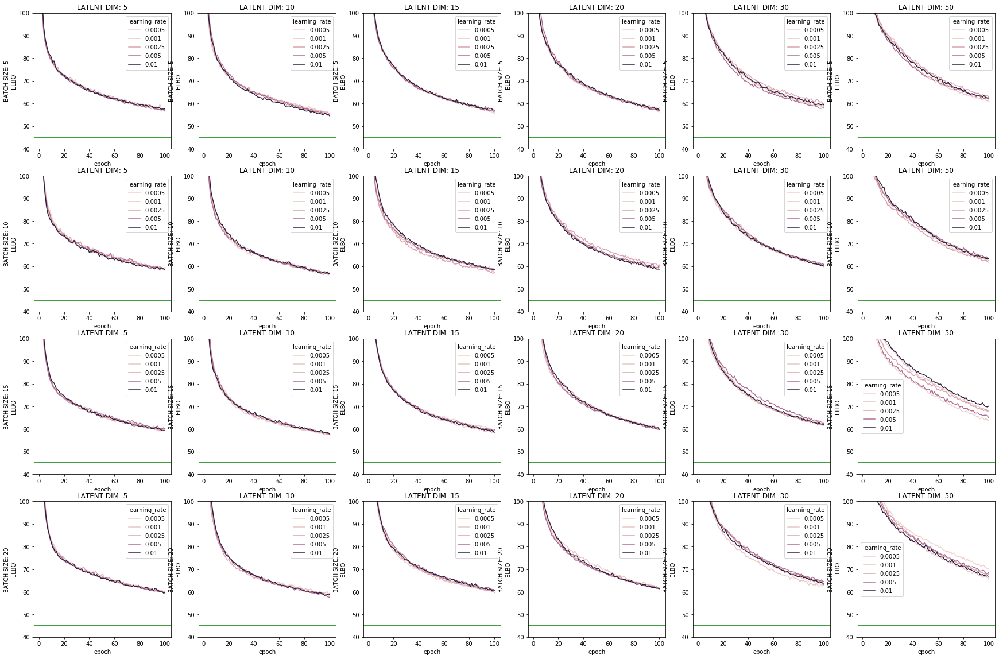

In [13]:
latent_dims = [5, 10, 15, 20, 30, 50]
batch_sizes = [5, 10, 15, 20]

fig, ax = plt.subplots(4,6, figsize=(30,20))
for i1,ax1 in enumerate(ax):
    for i2, ld in enumerate(latent_dims):

        subset = hyperparam_search[(hyperparam_search.batch_size == batch_sizes[i1]) & (hyperparam_search.latent_space == ld)]
        sns.lineplot(data=subset, x="epoch", y="test_loss", hue="learning_rate", ax=ax1[i2])
        ax1[i2].set_ylabel(f"BATCH SIZE: {batch_sizes[i1]}\nELBO")
        ax1[i2].set_title(f"LATENT DIM: {ld}")

In [21]:
labels = np.array(meta.Group)
#mmi_quant = uml.MNAR_MCAR_Imputer(max_iter=15)
X_train, X_test, y_train, y_test = train_test_split(data_quantile, targets, test_size=0.20, random_state=42, stratify=targets)

X_train.reset_index(drop=True, inplace=True)
X_test.reset_index(drop=True, inplace=True)
mmi_quant = uml.LowestValueImputerGaussian()
X_train = mmi_quant.fit_transform(X_train, y_train)
X_test = mmi_quant.transform(X_test, y_test)

mm_scaler = MinMaxScaler()
X_train = mm_scaler.fit_transform(X_train)
X_test = mm_scaler.transform(X_test)

In [22]:
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

train_loader = torch.utils.data.DataLoader(X_train, batch_size=5, shuffle=True)
test_loader = torch.utils.data.DataLoader(X_test, batch_size=5, shuffle=True)

vae_unfiltered = vae_utils.VariationalAutoencoder(10, 2615, 500)
trained_vae_unfiltered, test_loss, train_loss = vae_utils.trainVAE(vae_unfiltered, train_loader, test_loader, epochs=1000, lr=.001, verbose=True)

Epoch 1 loss: 131.77855544492422
	MSE: 129.03825929940464	KL: 2.7402953466916657
(VAL)	MSE: 118.3197274265519	KL: 3.6913292264363853	(122.01105637148203)

Epoch 2 loss: 119.40056527379048
	MSE: 115.51498229245105	KL: 3.8855828233512053
(VAL)	MSE: 106.15877725991858	KL: 5.862398078642696	(112.02117533856128)

Epoch 3 loss: 109.13776195480163
	MSE: 103.09113734601492	KL: 6.046625194779361
(VAL)	MSE: 95.04542886205466	KL: 6.943876726081572	(101.98930505959385)

Epoch 4 loss: 101.13693568218186
	MSE: 93.05319379323936	KL: 8.08374175680689
(VAL)	MSE: 88.38672876932534	KL: 7.9230009101959595	(96.309729610581)

Epoch 5 loss: 95.18081039980234
	MSE: 86.65685635302441	KL: 8.523953937622437
(VAL)	MSE: 83.8539701254971	KL: 8.519703876541321	(92.37367381819759)

Epoch 6 loss: 91.90815275261201
	MSE: 82.84937644866575	KL: 9.05877648204206
(VAL)	MSE: 82.96946077461702	KL: 7.334399269287845	(90.30386012433523)

Epoch 7 loss: 90.00730960340385
	MSE: 80.48719277439348	KL: 9.520117170839425
(VAL)	MSE: 7

Text(0, 0.5, 'Loss')

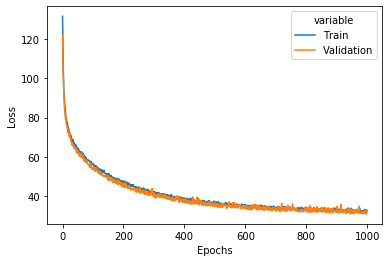

In [24]:
train_avg_loss = [value[0] for key, value in train_loss.items()]
val_avg_loss = [value[0] for key, value in test_loss.items()]

losses = pd.DataFrame({"Train": train_avg_loss, "Validation": val_avg_loss})
losses=losses.reset_index()

sns.lineplot(data=losses.melt(id_vars="index"), x="index", y="value", hue="variable")
plt.xlabel("Epochs")
plt.ylabel("Loss")

In [12]:
encoding_train_multiple, reconstruction_train_multiple = pd.DataFrame(), pd.DataFrame()
for i in range(20):
    encoding_train, reconstruction_train = vae_utils.useVAE(trained_vae_unfiltered, X_train)
    encoding_train_multiple = pd.concat([encoding_train_multiple, pd.DataFrame(encoding_train)], axis=0)
    reconstruction_train_multiple = pd.concat([reconstruction_train_multiple, pd.DataFrame(reconstruction_train)], axis=0)


Reconstructing 414 datapoints...
Reconstructing 414 datapoints...
Reconstructing 414 datapoints...
Reconstructing 414 datapoints...
Reconstructing 414 datapoints...
Reconstructing 414 datapoints...
Reconstructing 414 datapoints...
Reconstructing 414 datapoints...
Reconstructing 414 datapoints...
Reconstructing 414 datapoints...
Reconstructing 414 datapoints...
Reconstructing 414 datapoints...
Reconstructing 414 datapoints...
Reconstructing 414 datapoints...
Reconstructing 414 datapoints...
Reconstructing 414 datapoints...
Reconstructing 414 datapoints...
Reconstructing 414 datapoints...
Reconstructing 414 datapoints...
Reconstructing 414 datapoints...


In [13]:
encodings_train_multiple_ = pd.DataFrame(encoding_train_multiple).reset_index(drop=True)
encodings_train_multiple_["color"] = target_encoder.inverse_transform(list(y_train)*20)

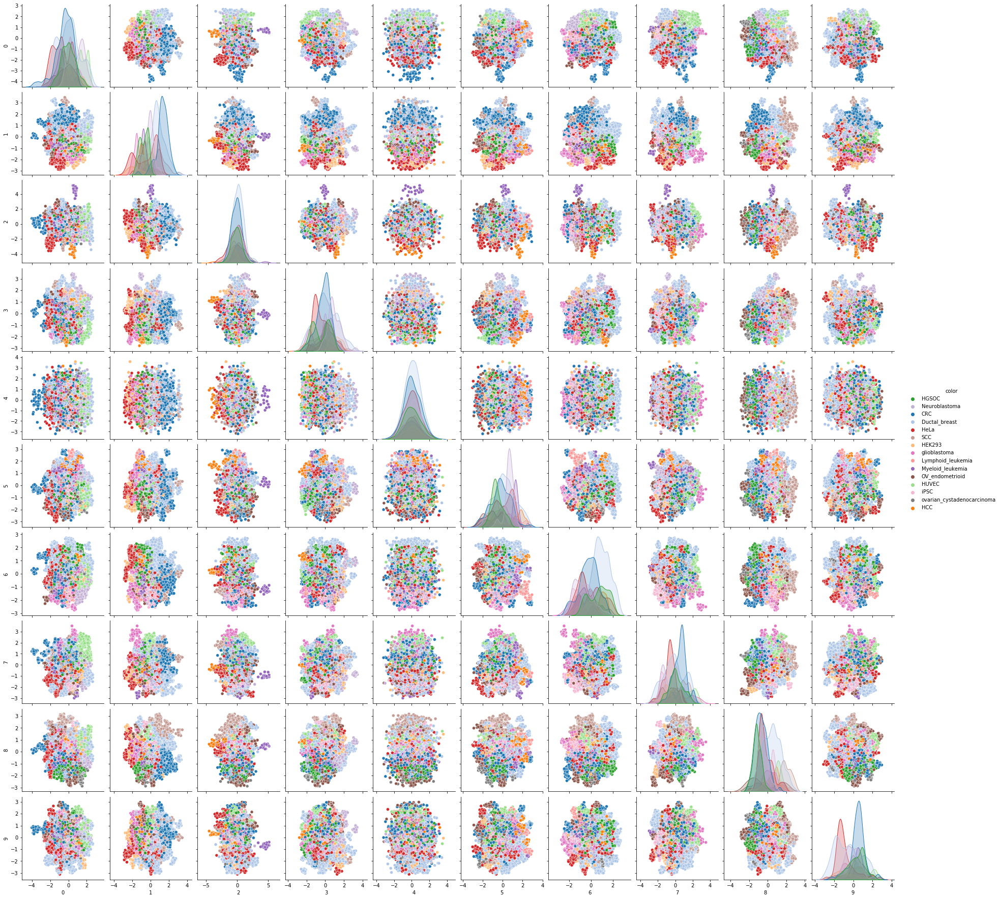

In [14]:
colors = sns.color_palette("tab20")[:15]
colors = {target_encoder.inverse_transform([x])[0]: colors[x] for x in unique_labels}
sns.pairplot(data=encodings_train_multiple_, hue = "color", palette= colors)

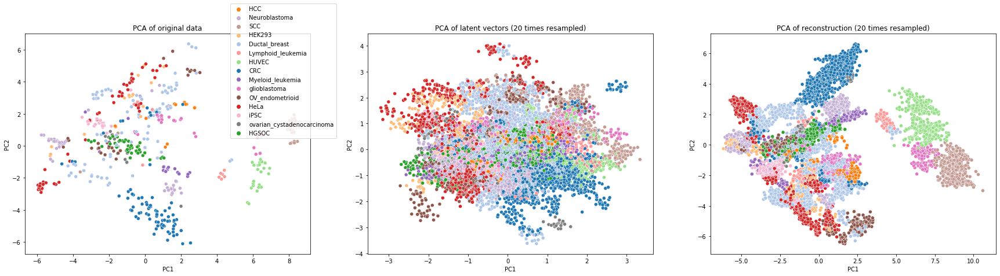

In [16]:
fig, ax = plt.subplots(1,3, figsize=(30,7))

pca = PCA(n_components=2)

ax[0].set_title("PCA of original data")
ax[1].set_title("PCA of latent vectors (20 times resampled)")
ax[2].set_title("PCA of reconstruction (20 times resampled)")
embeddings = pca.fit_transform(minmax_df_quant)
g=sns.scatterplot(data=pd.DataFrame(embeddings, columns = ["PC1", "PC2"]), x= "PC1", y = "PC2", hue = target_encoder.inverse_transform(targets), ax=ax[0], palette=colors)
sns.move_legend(g, "upper right", bbox_to_anchor=(1.1,1.15))

embeddings = pca.fit_transform(encoding_train_multiple)
sns.scatterplot(data=pd.DataFrame(embeddings, columns = ["PC1", "PC2"]), x= "PC1", y = "PC2", hue = target_encoder.inverse_transform(list(y_train)*20), ax=ax[1], palette=colors, legend=False)

embeddings = pca.fit_transform(reconstruction_train_multiple)
sns.scatterplot(data=pd.DataFrame(embeddings, columns = ["PC1", "PC2"]), x= "PC1", y = "PC2", hue = target_encoder.inverse_transform(list(y_train)*20), ax=ax[2], palette=colors, legend=False)

In [25]:
labels = np.array(meta.Group)
#mmi_quant = uml.MNAR_MCAR_Imputer(max_iter=15)
mmi_quant = uml.LowestValueImputerGaussian()
mmi_quant.fit(data_quantile, labels)
imputed_df_quant = mmi_quant.transform(data_quantile, labels)
mm_scaler = MinMaxScaler()
minmax_df_quant = mm_scaler.fit_transform(imputed_df_quant)

In [26]:
minmax_df_quant = minmax_df_quant.astype('float32')
loader = torch.utils.data.DataLoader(minmax_df_quant, batch_size=5, shuffle=True)

vae_unfiltered = vae_utils.VariationalAutoencoder(10, 2615, 500)
trained_vae_unfiltered, test_loss, train_loss = vae_utils.trainVAE(vae_unfiltered, loader, False, epochs=1000, lr=.001, verbose=True)


Epoch 1 loss: 125.22714695563683
	MSE: 121.52742187793439	KL: 3.6997257452458143
Epoch 2 loss: 108.47840785980225
	MSE: 103.51194719167856	KL: 4.9664605007721825
Epoch 3 loss: 100.15909326993503
	MSE: 93.12226614585289	KL: 7.036826917758355
Epoch 4 loss: 93.31511501165537
	MSE: 85.12480805470393	KL: 8.190306768967556
Epoch 5 loss: 88.34282053433932
	MSE: 79.30193611291739	KL: 9.040884627745701
Epoch 6 loss: 85.3006601700416
	MSE: 75.61101253216083	KL: 9.689647220648252
Epoch 7 loss: 83.23017677894005
	MSE: 73.47405341955331	KL: 9.756123286027174
Epoch 8 loss: 81.57095318574171
	MSE: 71.73147535324097	KL: 9.839477777481079
Epoch 9 loss: 79.69555392632118
	MSE: 69.68376522797804	KL: 10.011788941346682
Epoch 10 loss: 78.46443517391498
	MSE: 68.33280500998863	KL: 10.131630434439732
Epoch 11 loss: 76.68400349983803
	MSE: 66.55816085521991	KL: 10.125842649203081
Epoch 12 loss: 76.5404415497413
	MSE: 65.99374437332153	KL: 10.546697501952831
Epoch 13 loss: 75.84078198212843
	MSE: 65.0922030668

In [28]:
torch.save(trained_vae_unfiltered.state_dict(), "/home/compomics/Sam/git/python/master_thesis/Atlas_analysis/preprocessing/VAE_model")

In [32]:
vae_t = vae_utils.VariationalAutoencoder(10,2615,500)
vae_t.load_state_dict(torch.load("/home/compomics/Sam/git/python/master_thesis/Atlas_analysis/preprocessing/VAE_model"))

<All keys matched successfully>

In [33]:
encoding_train_multiple, reconstruction_train_multiple = pd.DataFrame(), pd.DataFrame()
for i in range(20):
    encoding_train, reconstruction_train = vae_utils.useVAE(vae_t, minmax_df_quant)
    encoding_train_multiple = pd.concat([encoding_train_multiple, pd.DataFrame(encoding_train)], axis=0)
    reconstruction_train_multiple = pd.concat([reconstruction_train_multiple, pd.DataFrame(reconstruction_train)], axis=0)


Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstruc

In [39]:
encodings_train_multiple_ = pd.DataFrame(encoding_train_multiple).reset_index(drop=True)
encodings_train_multiple_["color"] = target_encoder.inverse_transform(list(targets)*20)
colors_pxd = sns.color_palette("tab20") + sns.color_palette("dark") + sns.color_palette("colorblind") + sns.color_palette("bright")
colors_pxd = colors_pxd[:43]
encodings_train_multiple_["PXD_accession"] = list(meta.PXD_accession)*20

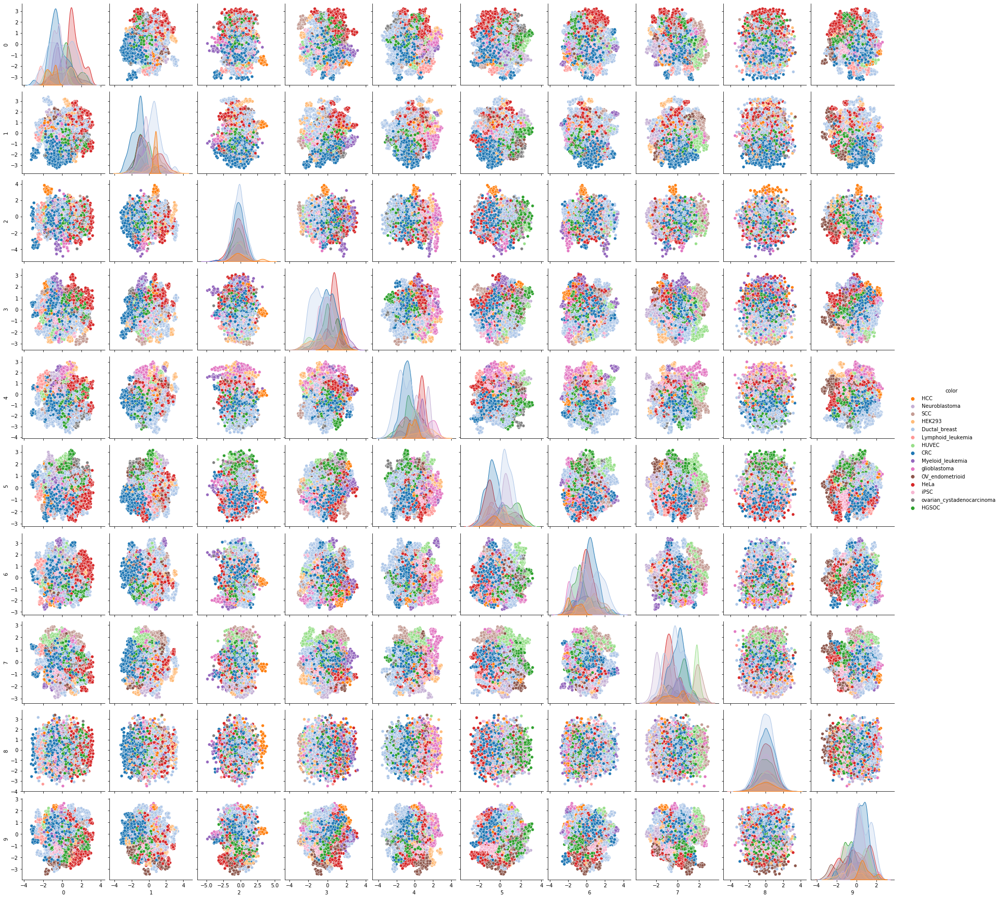

In [37]:
colors = sns.color_palette("tab20")[:15]
colors = {target_encoder.inverse_transform([x])[0]: colors[x] for x in unique_labels}
sns.pairplot(data=encodings_train_multiple_, hue = "color", palette= colors)

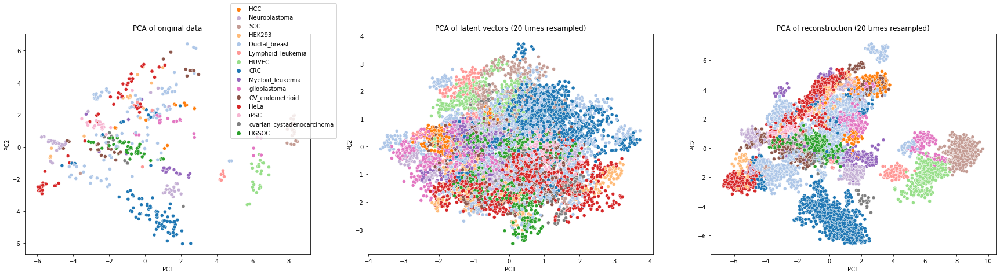

In [38]:
fig, ax = plt.subplots(1,3, figsize=(30,7))

pca = PCA(n_components=2)

ax[0].set_title("PCA of original data")
ax[1].set_title("PCA of latent vectors (20 times resampled)")
ax[2].set_title("PCA of reconstruction (20 times resampled)")
embeddings = pca.fit_transform(minmax_df_quant)
g=sns.scatterplot(data=pd.DataFrame(embeddings, columns = ["PC1", "PC2"]), x= "PC1", y = "PC2", hue = target_encoder.inverse_transform(targets), ax=ax[0], palette=colors)
sns.move_legend(g, "upper right", bbox_to_anchor=(1.1,1.15))

embeddings = pca.fit_transform(encoding_train_multiple)
sns.scatterplot(data=pd.DataFrame(embeddings, columns = ["PC1", "PC2"]), x= "PC1", y = "PC2", hue = target_encoder.inverse_transform(list(targets)*20), ax=ax[1], palette=colors, legend=False)

embeddings = pca.fit_transform(reconstruction_train_multiple)
sns.scatterplot(data=pd.DataFrame(embeddings, columns = ["PC1", "PC2"]), x= "PC1", y = "PC2", hue = target_encoder.inverse_transform(list(targets)*20), ax=ax[2], palette=colors, legend=False)

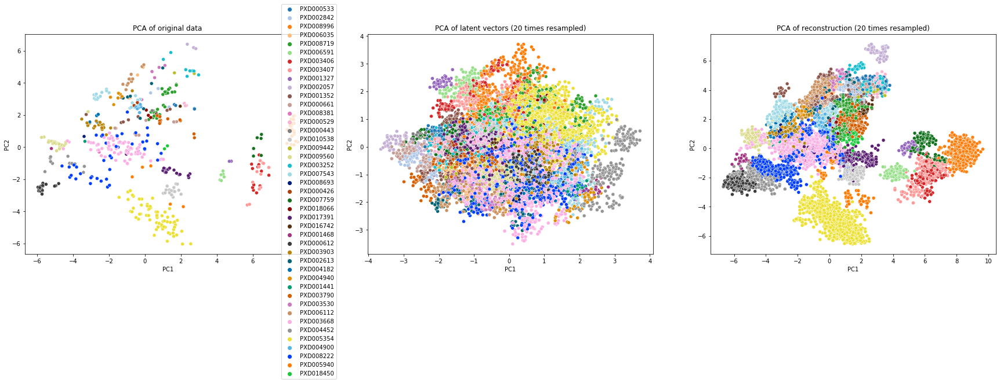

In [41]:
fig, ax = plt.subplots(1,3, figsize=(30,7))

pca = PCA(n_components=2)

ax[0].set_title("PCA of original data")
ax[1].set_title("PCA of latent vectors (20 times resampled)")
ax[2].set_title("PCA of reconstruction (20 times resampled)")
embeddings = pca.fit_transform(minmax_df_quant)
g=sns.scatterplot(data=pd.DataFrame(embeddings, columns = ["PC1", "PC2"]), x= "PC1", y = "PC2", hue = list(meta.PXD_accession), ax=ax[0], palette=colors_pxd)
sns.move_legend(g, "upper right", bbox_to_anchor=(1.1,1.15))

embeddings = pca.fit_transform(encoding_train_multiple)
sns.scatterplot(data=pd.DataFrame(embeddings, columns = ["PC1", "PC2"]), x= "PC1", y = "PC2", hue = list(meta.PXD_accession) *20, ax=ax[1], palette=colors_pxd, legend=False)

embeddings = pca.fit_transform(reconstruction_train_multiple)
sns.scatterplot(data=pd.DataFrame(embeddings, columns = ["PC1", "PC2"]), x= "PC1", y = "PC2", hue = list(meta.PXD_accession) *20, ax=ax[2], palette=colors_pxd, legend=False)

# Filtered

In [16]:
hyperparam_search = pd.read_csv("/home/compomics/Sam/git/python/master_thesis/Atlas_analysis/ML/results/VAE_hyperparameter_opt_filtered_LWVGI.csv", index_col="Unnamed: 0")

In [ ]:
hyperparam_search = pd.read_csv("/home/compomics/Sam/git/python/master_thesis/Atlas_analysis/ML/results/VAE_hyperparameter_opt_filtered_LWVGI.csv", index_col="Unnamed: 0")
latent_dims = [2,5,8,10,15]
batch_sizes = [5, 10]
kappa = [.001, .01, .05, .1, .3, .5, .75]
params = {"latent dimensions": [], "test_loss_mse": [], "kappa": []}

for i1 in range(len(kappa)):
    for ld in latent_dims:

        subset = hyperparam_search[(hyperparam_search.kappa == kappa[i1]) & (hyperparam_search.latent_space == ld)]
        
        params["test_loss_mse"].append(subset.test_loss_mse.min())
        params["latent dimensions"].append(ld)
        params["kappa"].append(kappa[i1])

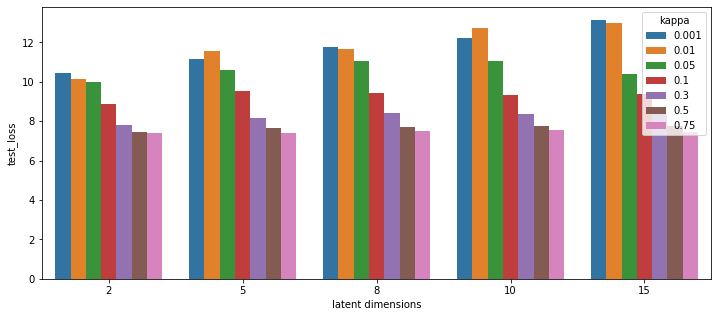

In [4]:
plt.figure(figsize=(12,5))
sns.barplot(data=pd.DataFrame(params), x="latent dimensions", y="test_loss", hue="kappa")

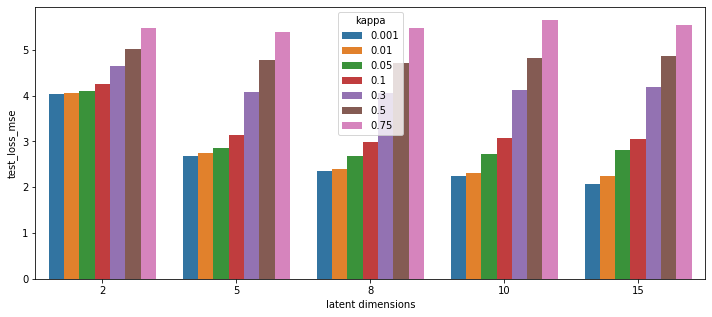

In [35]:
plt.figure(figsize=(12,5))
sns.barplot(data=pd.DataFrame(params), x="latent dimensions", y="test_loss_mse", hue="kappa")

In [5]:
pd.DataFrame(params).sort_values(by="test_loss")

,latent dimensions,test_loss,kappa
30,2,7.378599,0.750
31,5,7.421506,0.750
34,15,7.450885,0.750
25,2,7.456626,0.500
32,8,7.492633,0.750
33,10,7.532588,0.750
26,5,7.678107,0.500
27,8,7.700850,0.500
29,15,7.746039,0.500
28,10,7.751662,0.500


In [33]:
kl_mse = hyperparam_search[(hyperparam_search.kappa == .1) & (hyperparam_search.batch_size == 5) & (hyperparam_search.latent_space == 5) & (hyperparam_search.learning_rate == .001) ]

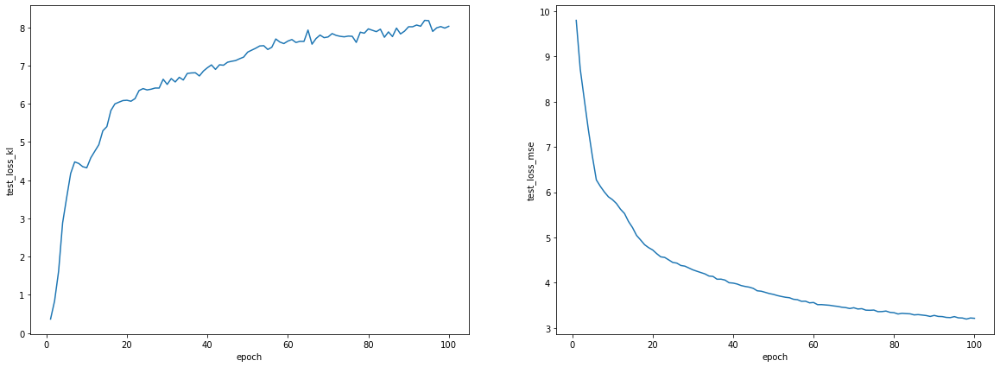

In [34]:
fig, ax = plt.subplots(1,2, figsize=(20,7))
sns.lineplot(data= kl_mse, x="epoch", y="test_loss_kl", ax=ax[0])
sns.lineplot(data= kl_mse, x="epoch", y="test_loss_mse", ax=ax[1])

In [4]:
labels = np.array(meta.Group)
#mmi_quant = uml.MNAR_MCAR_Imputer(max_iter=15)
mmi_quant = uml.LowestValueImputerGaussian()
mmi_quant.fit(data_quantile, labels)
imputed_df_quant = mmi_quant.transform(data_quantile, labels)

In [5]:
# Perform imputation
labels = np.array(meta.Group)

with open("selected_features.txt", "r") as f:
    features = f.readlines()
    features = [x.strip() for x in features]

feature_mask = protein_columns.isin(features)

filtered_dataset = imputed_df_quant.loc[:,feature_mask]

In [6]:
mm_scaler = MinMaxScaler()
filtered_dataset = mm_scaler.fit_transform(filtered_dataset)

In [8]:
# Retrain and check the latent variable distribution
filtered_dataset = filtered_dataset.astype('float32')

X_train, X_test, y_train, y_test = train_test_split(filtered_dataset, targets, test_size=0.20, random_state=42, stratify=targets)

train_loader = torch.utils.data.DataLoader(X_train, batch_size=5, shuffle=True)
test_loader = torch.utils.data.DataLoader(X_test, batch_size=5, shuffle=True)

vae = vae_utils.VariationalAutoencoder(6, 161, 50)
trained_vae, test_loss, train_loss = vae_utils.trainVAE(vae, train_loader, validation_data=test_loader, epochs=500, lr=.0001, kappa=.1, verbose=True)

Epoch 1 loss: 10.032269477844238
	MSE: 9.482588262443082	KL: 0.5496811759938677
(VAL)	MSE: 8.723202303231481	KL: 0.6797585042126207	(9.402960828987949)

Epoch 2 loss: 9.156600176569928
	MSE: 8.598220365593232	KL: 0.5583797808153084
(VAL)	MSE: 8.39063457121332	KL: 0.6930943117084274	(9.083728870713568)

Epoch 3 loss: 9.267192013292428
	MSE: 8.05243593813425	KL: 1.214756024889199
(VAL)	MSE: 7.509552547730595	KL: 2.3903333523187293	(9.899885855525373)

Epoch 4 loss: 10.038075918174652
	MSE: 7.162258021802788	KL: 2.875817883445556
(VAL)	MSE: 6.766040267714535	KL: 3.5933775557092873	(10.359417788953666)

Epoch 5 loss: 10.683169284498835
	MSE: 6.5059186866484495	KL: 4.177250583487821
(VAL)	MSE: 6.325728674969041	KL: 4.3638247495674225	(10.689553490604263)

Epoch 6 loss: 10.616923975657267
	MSE: 6.249060969754874	KL: 4.367863026009985
(VAL)	MSE: 6.089576100728598	KL: 4.403954962649977	(10.493531043270984)

Epoch 7 loss: 11.086936376180994
	MSE: 6.094780468078981	KL: 4.9921559339546295
(VAL)	M

Text(0, 0.5, 'MSE')

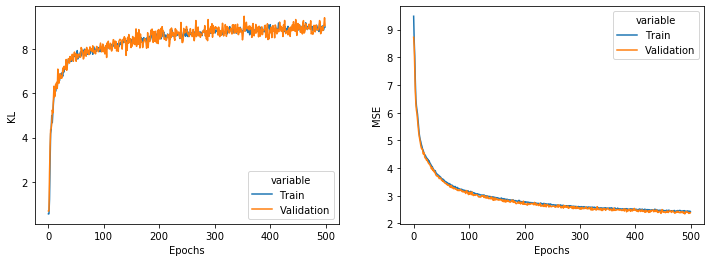

In [17]:
fig, ax = plt.subplots(1,2, figsize=(12,4))

train_mse_loss = [value[1] for key, value in train_loss.items()]
val_mse_loss = [value[1] for key, value in test_loss.items()]

train_kl_loss = [value[2] for key, value in train_loss.items()]
val_kl_loss = [value[2] for key, value in test_loss.items()]

losses_mse = pd.DataFrame({"Train": train_mse_loss, "Validation": val_mse_loss}).reset_index()
losses_kl = pd.DataFrame({"Train": train_kl_loss, "Validation": val_kl_loss}).reset_index()

sns.lineplot(data=losses_kl.melt(id_vars="index"), x="index", y="value", hue="variable", ax=ax[0])
sns.lineplot(data=losses_mse.melt(id_vars="index"), x="index", y="value", hue="variable", ax=ax[1])

ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("KL")

ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("MSE")

Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstruc

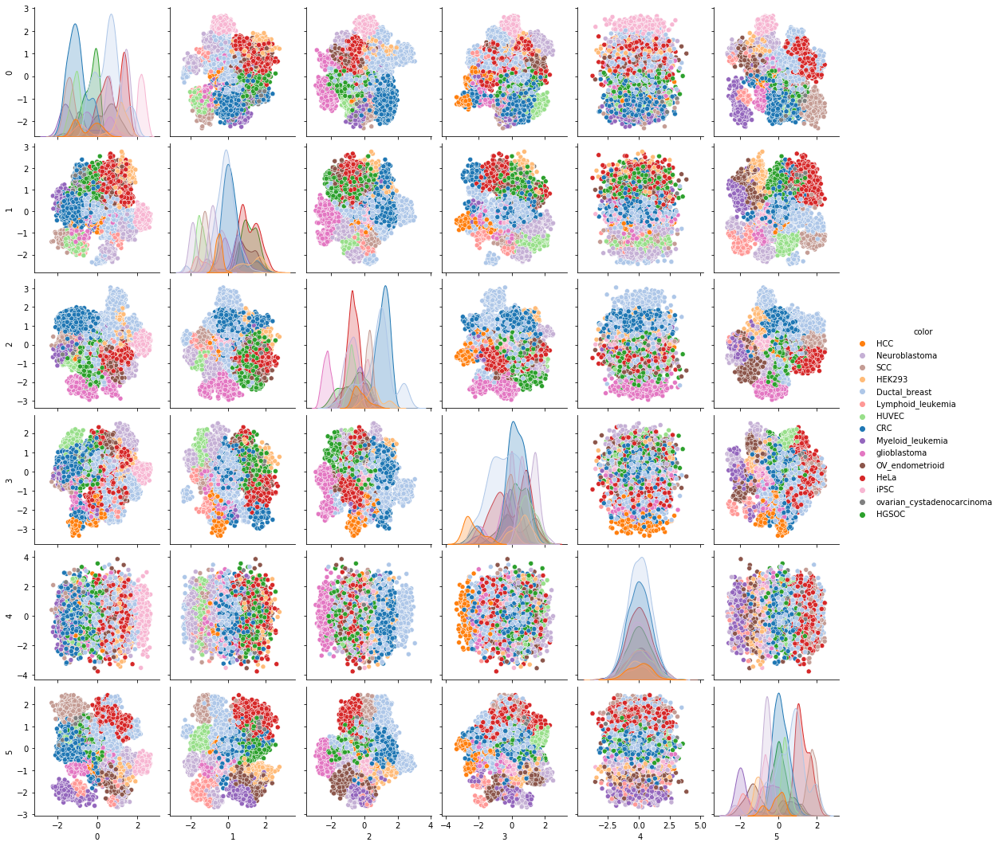

In [11]:
colors=sns.color_palette("tab20")[:15]
colors = {target_encoder.inverse_transform([x])[0]: colors[x] for x in unique_labels}
encoding_train_multiple, reconstruction_train_multiple = pd.DataFrame(), pd.DataFrame()
for i in range(20):
    encoding_train, reconstruction_train = vae_utils.useVAE(trained_vae, filtered_dataset)
    encoding_train_multiple = pd.concat([encoding_train_multiple, pd.DataFrame(encoding_train)], axis=0)
    reconstruction_train_multiple = pd.concat([reconstruction_train_multiple, pd.DataFrame(reconstruction_train)], axis=0)

encodings_train_multiple_ = pd.DataFrame(encoding_train_multiple).reset_index(drop=True)
encodings_train_multiple_["color"] = target_encoder.inverse_transform(list(targets)*20)
sns.pairplot(data=encodings_train_multiple_, hue = "color", palette= colors)

In [ ]:
loader = torch.utils.data.DataLoader(filtered_dataset, batch_size=5, shuffle=True)

vae = vae_utils.VariationalAutoencoder(6, 161, 50)
trained_vae, test_loss, train_loss = vae_utils.trainVAE(vae, train_loader, validation_data=loader, epochs=500, lr=.0001, kappa=.1, verbose=True)

In [ ]:
encodings, _ = vae_utils.useVAE(trained_vae, filtered_dataset)

Reconstructing 518 datapoints...
Reconstructed 500/518


In [ ]:
colors=sns.color_palette("tab20")[:15]
lut={i:colors[i] for i in np.unique(targets)}
lut = pd.Series(targets).map(lut)

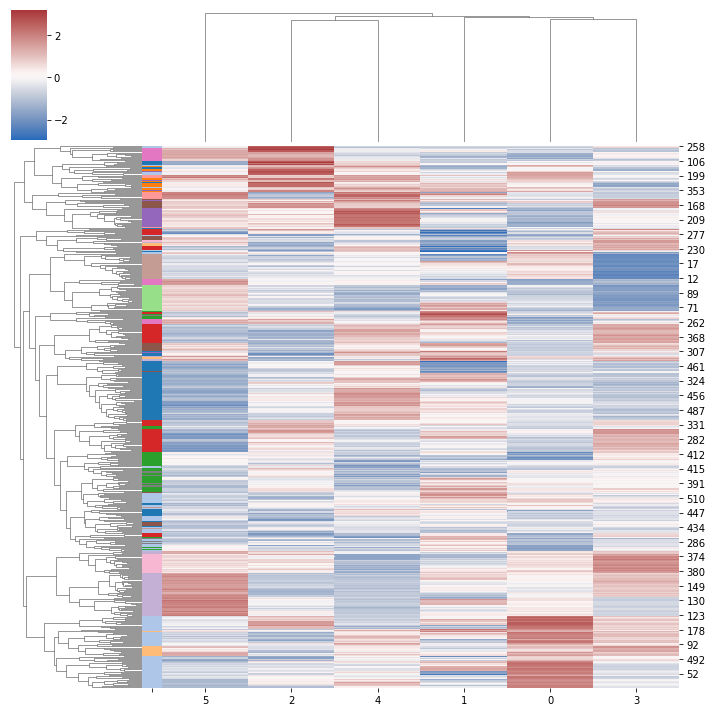

In [ ]:
sns.clustermap(pd.DataFrame(encodings), row_colors=lut, cmap="vlag")

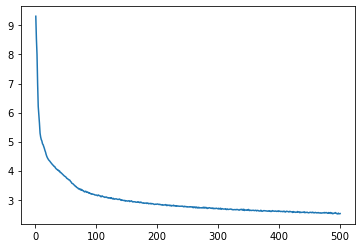

In [ ]:
train_avg_loss = [value[1] for key, value in train_loss.items()]

sns.lineplot(y=train_avg_loss, x=list(range(1,501)))

Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstruc

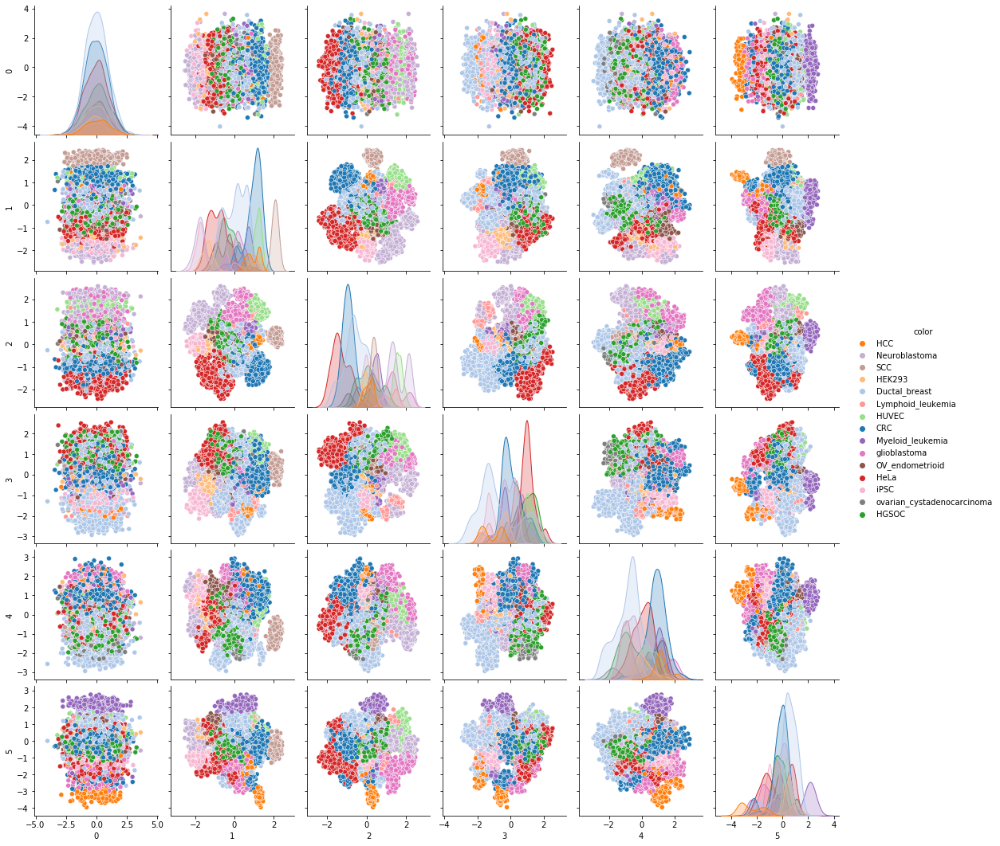

In [ ]:
colors=sns.color_palette("tab20")[:15]
colors = {target_encoder.inverse_transform([x])[0]: colors[x] for x in unique_labels}
encoding_train_multiple, reconstruction_train_multiple = pd.DataFrame(), pd.DataFrame()
for i in range(20):
    encoding_train, reconstruction_train = vae_utils.useVAE(trained_vae, filtered_dataset)
    encoding_train_multiple = pd.concat([encoding_train_multiple, pd.DataFrame(encoding_train)], axis=0)
    reconstruction_train_multiple = pd.concat([reconstruction_train_multiple, pd.DataFrame(reconstruction_train)], axis=0)

encodings_train_multiple_ = pd.DataFrame(encoding_train_multiple).reset_index(drop=True)
encodings_train_multiple_["color"] = target_encoder.inverse_transform(list(targets)*20)
sns.pairplot(data=encodings_train_multiple_, hue = "color", palette= colors)

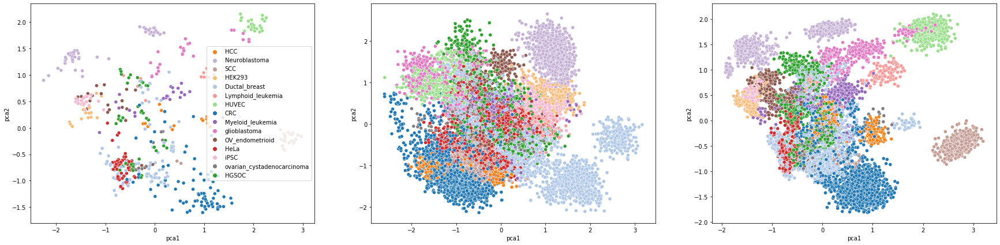

In [ ]:
fig, ax = plt.subplots(1,3, figsize=(30,7))

pca = PCA(n_components=2)

embeddings = pca.fit_transform(filtered_dataset)
sns.scatterplot(data=pd.DataFrame(embeddings, columns = ["pca1", "pca2"]), x= "pca1", y = "pca2", hue = target_encoder.inverse_transform(targets), ax=ax[0], palette=colors)

embeddings = pca.fit_transform(encoding_train_multiple)
sns.scatterplot(data=pd.DataFrame(embeddings, columns = ["pca1", "pca2"]), x= "pca1", y = "pca2", hue = target_encoder.inverse_transform(list(targets)*20), ax=ax[1], palette=colors, legend=False)

embeddings = pca.fit_transform(reconstruction_train_multiple)
sns.scatterplot(data=pd.DataFrame(embeddings, columns = ["pca1", "pca2"]), x= "pca1", y = "pca2", hue = target_encoder.inverse_transform(list(targets)*20), ax=ax[2], palette=colors, legend=False)

In [ ]:
torch.save(trained_vae.state_dict(), "/home/compomics/Sam/git/python/master_thesis/Atlas_analysis/preprocessing/VAE_model_filtered")

In [ ]:
colors_pxd = sns.color_palette("tab20") + sns.color_palette("dark") + sns.color_palette("colorblind") + sns.color_palette("bright")
colors_pxd = colors_pxd[:43]

encodings_train_multiple_ = pd.DataFrame(encoding_train_multiple).reset_index(drop=True)
encodings_train_multiple_["color"] = target_encoder.inverse_transform(list(targets)*20)
encodings_train_multiple_["PXD_accession"] = list(meta.PXD_accession)*20

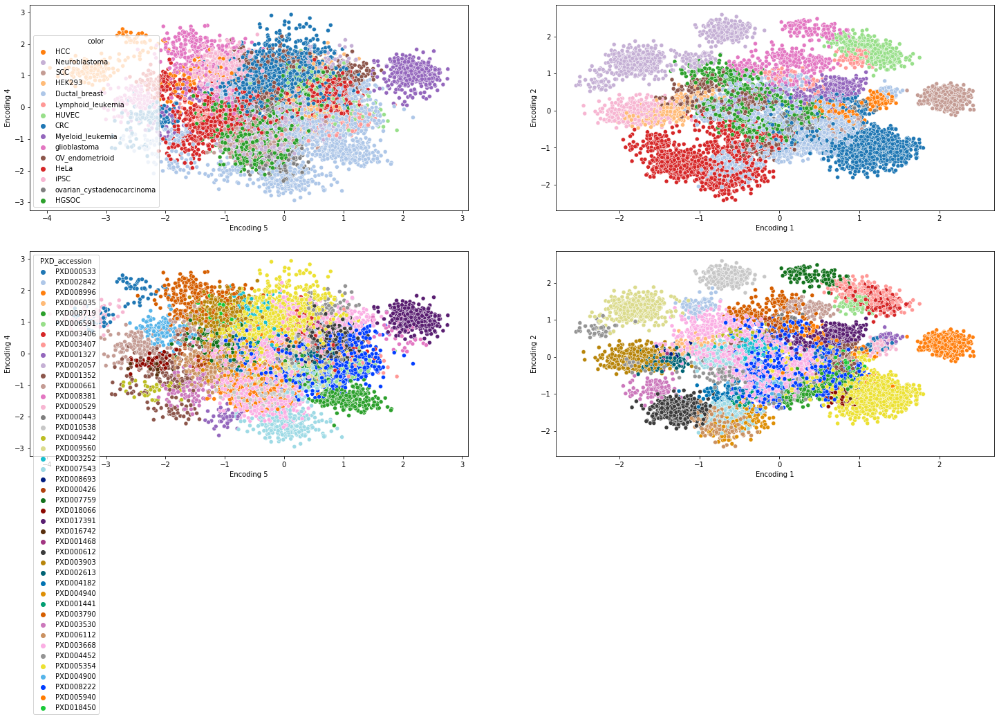

In [ ]:
# The one project that is clustered with myeloid leukemia is CCRF-CEM
# Also note that HEK293 and iPSC cluster closely together suggesting an overlap biologically
fig, (ax1,ax2) = plt.subplots(2,2, figsize=(25,12))

ax1[0].set_xlabel("Encoding 5")
ax1[0].set_ylabel("Encoding 4")

ax1[1].set_xlabel("Encoding 1")
ax1[1].set_ylabel("Encoding 2")

ax2[0].set_xlabel("Encoding 5")
ax2[0].set_ylabel("Encoding 4")

ax2[1].set_xlabel("Encoding 1")
ax2[1].set_ylabel("Encoding 2")

sns.scatterplot(data=encodings_train_multiple_, x=5, y=4, hue = "color", palette= colors, ax= ax1[0])
sns.scatterplot(data=encodings_train_multiple_, x=1, y=2, hue = "color", palette= colors, ax= ax1[1], legend=False)

sns.scatterplot(data=encodings_train_multiple_, x=5, y=4, hue = "PXD_accession", palette= colors_pxd, ax=ax2[0])
sns.scatterplot(data=encodings_train_multiple_, x=1, y=2, hue = "PXD_accession", palette= colors_pxd, ax=ax2[1], legend=False)

---

work in progress from here on

## When doing KL-annealing as described in beta-VAE paper

KL weight steadily increases over 100 epochs and stabilises at value of kappa, which has been previously optimised.

In [ ]:
# Perform imputation
labels = np.array(meta.Group)

with open("selected_features.txt", "r") as f:
    features = f.readlines()
    features = [x.strip() for x in features]

feature_mask = protein_columns.isin(features)

selection = imputed_df_quant.loc[:,feature_mask]

In [ ]:
selection = selection.astype('float32')

train_loader = torch.utils.data.DataLoader(selection, batch_size=10, shuffle=True)

vae = vae_utils.VariationalAutoencoder(5, selection.shape[1], 50)
trained_vae, _, train_loss = vae_utils.trainVAE(vae, train_loader, epochs=500, lr=.0001, kappa=.1, verbose=True, annealing=True)

Epoch 1 loss: 4.787259858388167
	MSE: 4.787259858388167	KL: 0.0
Epoch 2 loss: 4.276692532576048
	MSE: 4.276692532576048	KL: 0.0
Epoch 3 loss: 4.232242277035346
	MSE: 4.138820120921502	KL: 0.09342212344591434
Epoch 4 loss: 3.9006883822954617
	MSE: 3.7775626686903148	KL: 0.12312570744409011
Epoch 5 loss: 3.366350238139813
	MSE: 3.1840973037939806	KL: 0.18225294523514235
Epoch 6 loss: 3.105472436318031
	MSE: 2.8780585756668677	KL: 0.22741385348714316
Epoch 7 loss: 2.960063705077538
	MSE: 2.7089727887740502	KL: 0.2510909140110016
Epoch 8 loss: 2.8559094850833597
	MSE: 2.5804311954058132	KL: 0.2754782885313034
Epoch 9 loss: 2.7728794125410228
	MSE: 2.4889067709445953	KL: 0.2839726278415093
Epoch 10 loss: 2.7546814680099487
	MSE: 2.445177837060048	KL: 0.30950364757042664
Epoch 11 loss: 2.7017046190225162
	MSE: 2.3878767490386963	KL: 0.3138278785806436
Epoch 12 loss: 2.679652459346331
	MSE: 2.356920510530472	KL: 0.32273195397395354
Epoch 13 loss: 2.61803530729734
	MSE: 2.29197175686176	KL: 0.

In [ ]:
mse = [x[1] for x in train_loss.values()]
kl = [x[2] for x in train_loss.values()]

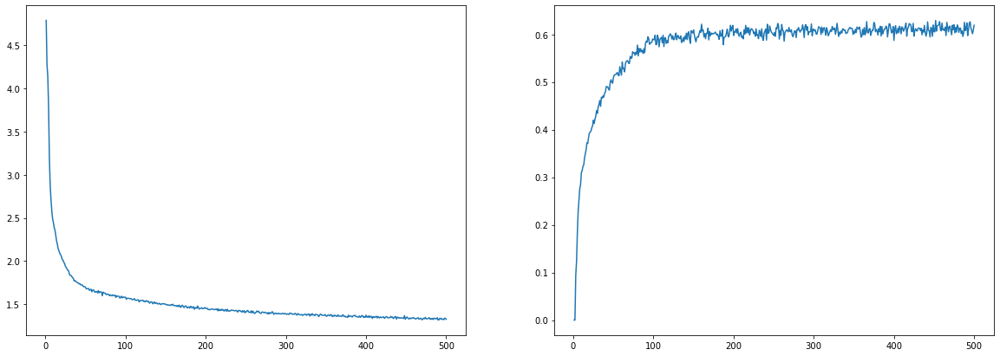

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(20,7))
sns.lineplot(y= mse, x=list(range(1,501)), ax=ax[0])
sns.lineplot(y= kl, x=list(range(1,501)), ax=ax[1])

In [ ]:
encoding_train_multiple, reconstruction_train_multiple = pd.DataFrame(), pd.DataFrame()
for i in range(20):
    encoding_train, reconstruction_train = vae_utils.useVAE(trained_vae, selection)
    encoding_train_multiple = pd.concat([encoding_train_multiple, pd.DataFrame(encoding_train)], axis=0)
    reconstruction_train_multiple = pd.concat([reconstruction_train_multiple, pd.DataFrame(reconstruction_train)], axis=0)

Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstructing 518 datapoints...
Reconstructed 500/518
Reconstruc

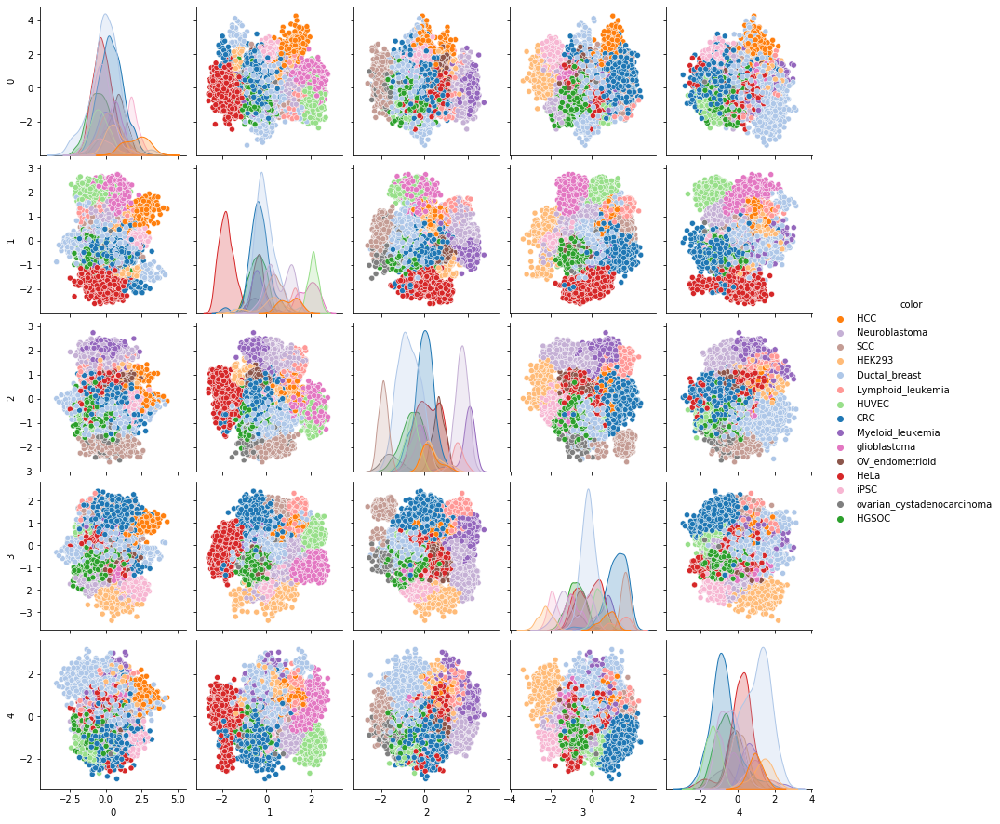

In [ ]:
colors = sns.color_palette("tab20")[:15]
colors = {target_encoder.inverse_transform([x])[0]: colors[x] for x in unique_labels}

encodings_train_multiple_ = pd.DataFrame(encoding_train_multiple).reset_index(drop=True)
encodings_train_multiple_["color"] = target_encoder.inverse_transform(list(targets)*20)
sns.pairplot(data=encodings_train_multiple_, hue = "color", palette= colors)

In [ ]:
colors_pxd = sns.color_palette("tab20") + sns.color_palette("dark") + sns.color_palette("colorblind") + sns.color_palette("bright")
colors_pxd = colors_pxd[:43]

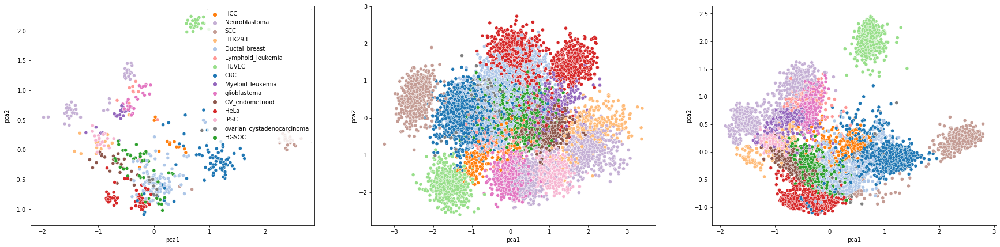

In [ ]:
fig, ax = plt.subplots(1,3, figsize=(30,7))

pca = PCA(n_components=2)

embeddings = pca.fit_transform(selection)
sns.scatterplot(data=pd.DataFrame(embeddings, columns = ["pca1", "pca2"]), x= "pca1", y = "pca2", hue = target_encoder.inverse_transform(targets), ax=ax[0], palette=colors)

embeddings = pca.fit_transform(encoding_train_multiple)
sns.scatterplot(data=pd.DataFrame(embeddings, columns = ["pca1", "pca2"]), x= "pca1", y = "pca2", hue = target_encoder.inverse_transform(list(targets)*20), ax=ax[1], palette=colors, legend=False)

embeddings = pca.fit_transform(reconstruction_train_multiple)
sns.scatterplot(data=pd.DataFrame(embeddings, columns = ["pca1", "pca2"]), x= "pca1", y = "pca2", hue = target_encoder.inverse_transform(list(targets)*20), ax=ax[2], palette=colors, legend=False)

/home/compomics/miniconda3/envs/ionbot/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/compomics/miniconda3/envs/ionbot/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/compomics/miniconda3/envs/ionbot/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/compomics/miniconda3/envs/ionbot/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/compomics/miniconda3/envs/ionbot/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'ran

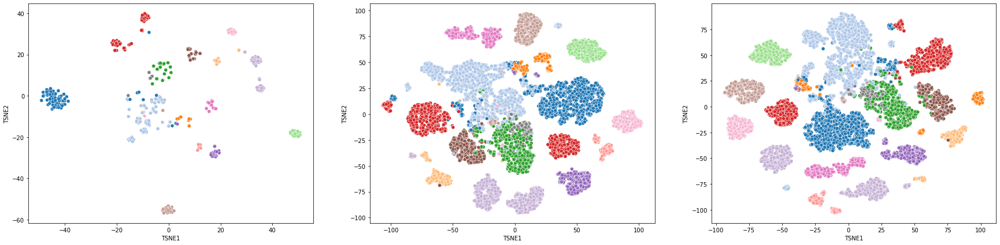

In [ ]:
fig, ax = plt.subplots(1,3, figsize=(30,7))

tsne = TSNE(perplexity=20)

embeddings = tsne.fit_transform(selection)
sns.scatterplot(data=pd.DataFrame(embeddings, columns = ["TSNE1", "TSNE2"]), x= "TSNE1", y = "TSNE2", hue = target_encoder.inverse_transform(targets), ax=ax[0], palette=colors, legend=False)

embeddings = tsne.fit_transform(encoding_train_multiple)
sns.scatterplot(data=pd.DataFrame(embeddings, columns = ["TSNE1", "TSNE2"]), x= "TSNE1", y = "TSNE2", hue = target_encoder.inverse_transform(list(targets)*20), ax=ax[1], palette=colors, legend=False)

embeddings = tsne.fit_transform(reconstruction_train_multiple)
sns.scatterplot(data=pd.DataFrame(embeddings, columns = ["TSNE1", "TSNE2"]), x= "TSNE1", y = "TSNE2", hue = target_encoder.inverse_transform(list(targets)*20), ax=ax[2], palette=colors, legend=False)

In [ ]:
encodings_train_multiple_ = pd.DataFrame(encoding_train_multiple).reset_index(drop=True)
encodings_train_multiple_["color"] = target_encoder.inverse_transform(list(targets)*20)
encodings_train_multiple_["PXD_accession"] = list(meta.PXD_accession)*20

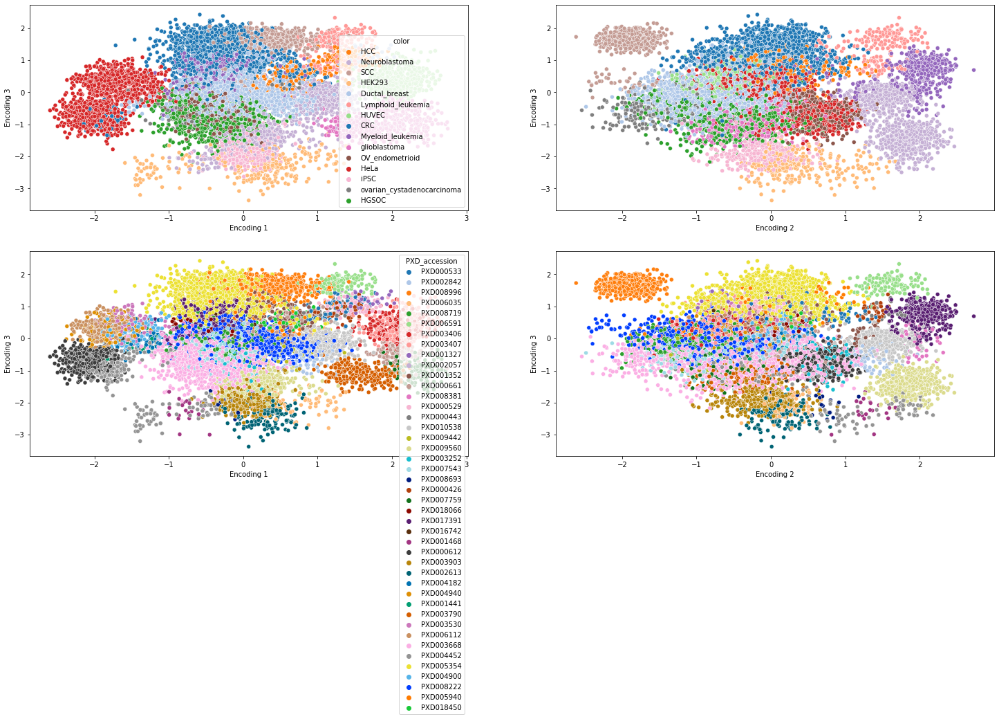

In [ ]:
# The one project that is clustered with myeloid leukemia is CCRF-CEM
# Also note that HEK293 and iPSC cluster closely together suggesting an overlap biologically
fig, (ax1,ax2) = plt.subplots(2,2, figsize=(25,12))

ax1[0].set_xlabel("Encoding 1")
ax1[0].set_ylabel("Encoding 3")

ax1[1].set_xlabel("Encoding 2")
ax1[1].set_ylabel("Encoding 3")

ax2[0].set_xlabel("Encoding 1")
ax2[0].set_ylabel("Encoding 3")

ax2[1].set_xlabel("Encoding 2")
ax2[1].set_ylabel("Encoding 3")

sns.scatterplot(data=encodings_train_multiple_, x=1, y=3, hue = "color", palette= colors, ax= ax1[0])
sns.scatterplot(data=encodings_train_multiple_, x=2, y=3, hue = "color", palette= colors, ax= ax1[1], legend=False)

sns.scatterplot(data=encodings_train_multiple_, x=1, y=3, hue = "PXD_accession", palette= colors_pxd, ax=ax2[0])
sns.scatterplot(data=encodings_train_multiple_, x=2, y=3, hue = "PXD_accession", palette= colors_pxd, ax=ax2[1], legend=False)